<a href="https://colab.research.google.com/github/larissa-rangel/MO443-processamento-de-imagem-digital/blob/main/MO443_T2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **TRABALHO 2 - MÉTODOS DE LIMIARIZAÇÃO**
# *Disciplina: MO443    Professor: Hélio Pedrini*

O proposito deste trabalho é realizar experimentos com métodos de limiarização ao global e local em imagens monocromáticas. Métodos de limiarização global determinam um único valor de limiar para toda a imagem.
Por outro lado, metodos de limiarização adaptativa local calculam um limiar para cada pixel da imagem com
base na informação contida em uma vizinhança do pixel. Em ambos os casos, se um pixel p(x, y) na imagem
de entrada possuir um valor mais alto que o limiar, então o pixel  p(x, y) é classificado como objeto (preto),
caso contrário, ele é rotulado como fundo (branco).

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install pgm_reader

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Codec: b'P2\n'
Reading P2 maps
(256, 256) int64


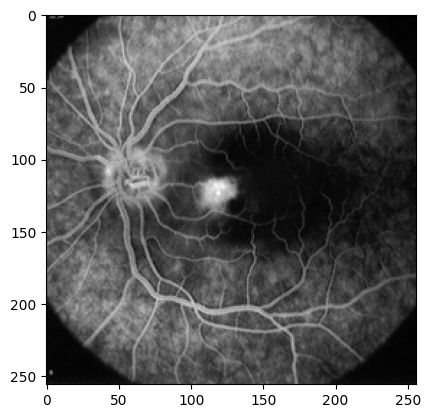

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pgm_reader import Reader
from google.colab.patches import cv2_imshow
import cv2 as cv
#Realizar a leitura da imagem
pgm_file = '/content/drive/MyDrive/Unicamp/23.1/Introdução ao processamento de imagens/Trabalho2/retina.pgm'
reader = Reader()
retina = reader.read_pgm(pgm_file)
width = reader.width

#Imprimir a imagem e as dimensões
print(retina.shape, retina.dtype)
plt.imshow(retina,cmap='gray')
plt.show()

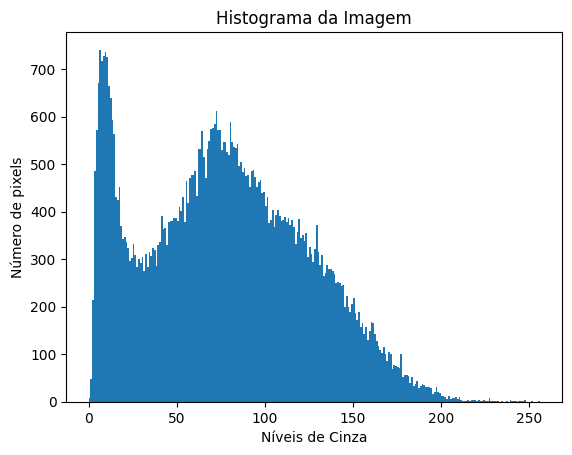

In [ ]:
# calcular o histograma da imagem
histr = plt.hist(retina.ravel(),256,[0,256])
plt.title('Histograma da Imagem')
plt.xlabel('Níveis de Cinza')
plt.ylabel('Número de pixels')
plt.show()

#Limiarização Global

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


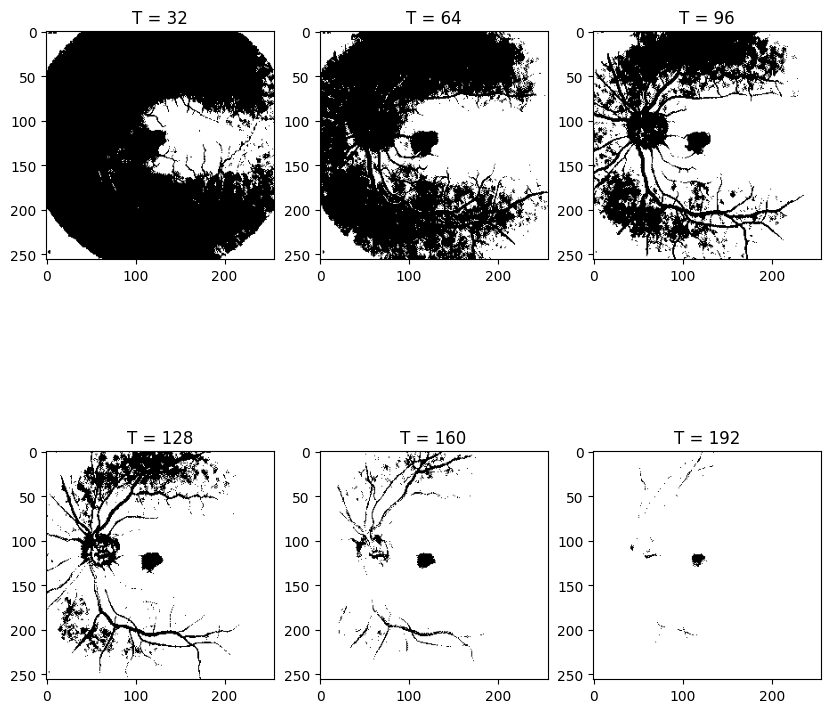

In [ ]:
#Limiarização Global para valores diferentes de T
T=np.array((32,64,96,128,160,192))
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(T)):
  Th_global=np.zeros(retina.shape)
  for k in range(retina.shape[0]):
    for j in range(retina.shape[1]):
      if retina[k,j] > T[i]:
        Th_global[k,j] = 0
      else:
        Th_global[k,j] = 255 #perguntar ao professor se esta convenção está certa
  Th_global=Th_global.astype(np.uint8)
  print(Th_global.shape, Th_global.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('T = '+str(T[i]))
  plt.imshow(Th_global,cmap='gray')


plt.show()#exibir a figura

#Metodo de Otsu

https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
https://www.tutorialspoint.com/how-to-perform-otsu-s-thresholding-on-an-image-using-python-opencv

(256, 256) int64
255 0
(256, 256) uint8


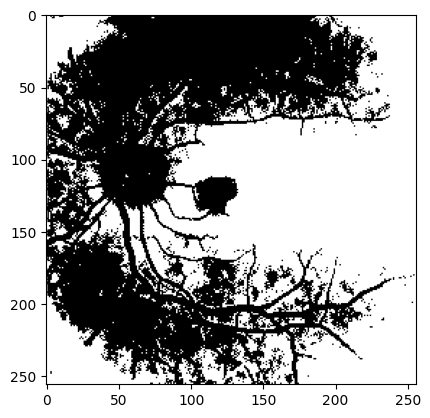

In [ ]:
img_B  = abs(255-retina) #Subtrai 255 de todos os elementos da matriz original e faz o módulo do resultado
print(img_B .shape,img_B .dtype)
print(img_B.max(),img_B.min())
ret2,th2 = cv.threshold(img_B.astype(np.uint8),0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)

print(th2.shape, th2.dtype)
plt.imshow(th2,cmap='gray')

#Metodo de Bernsen

https://www.mathworks.com/matlabcentral/fileexchange/40856-bernsen-local-image-thresholding

In [ ]:
def MyBernsen (A,n):
    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            Tmax = np.max(K)
            Tmin = np.min(K)
            T = int((Tmin+Tmax)/2)
            #print(T)
            if A[i,j] > T:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


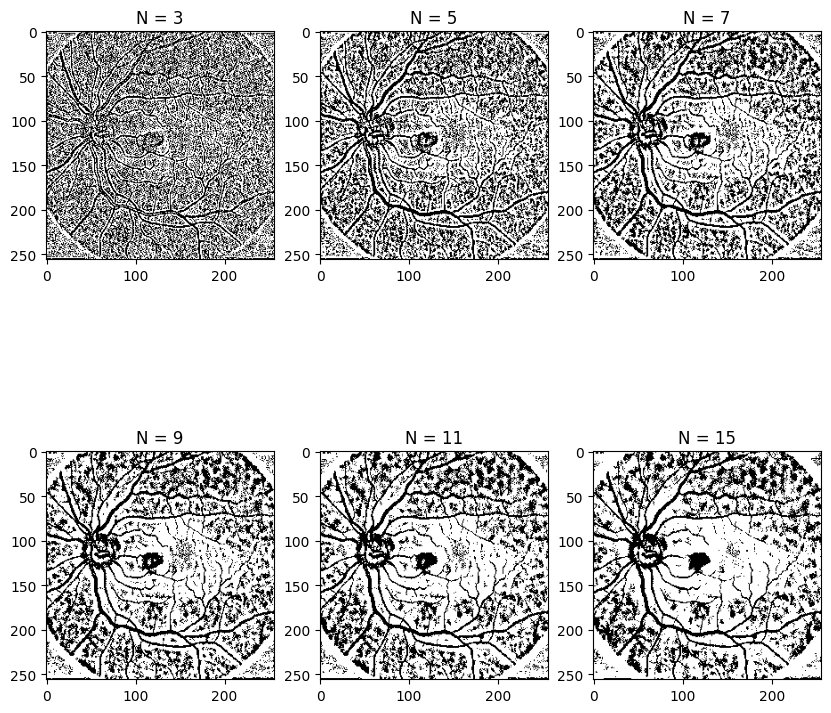

In [ ]:
n=np.array((3,5,7,9,11,15))#vizinhanças
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_bernsen = MyBernsen(retina,n[i])
  Th_bernsen = Th_bernsen.astype(np.uint8)
  print(Th_bernsen.shape, Th_bernsen.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i]))
  plt.imshow(Th_bernsen,cmap='gray')


plt.show()#exibir a figura

#Metodo de Niblack
Trier e Jain (1995) sugerem que resultados satisfat´orios podem ser obtidos com uma janela de tamanho n = 15 e k = −0.2

In [ ]:
def MyNickelback (A,n,k):  #rsrsrsrs
    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            media = np.mean(K)
            dsvp = np.std(K)
            T = int(media + k*dsvp)
            #print(T)
            if A[i,j] > T:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


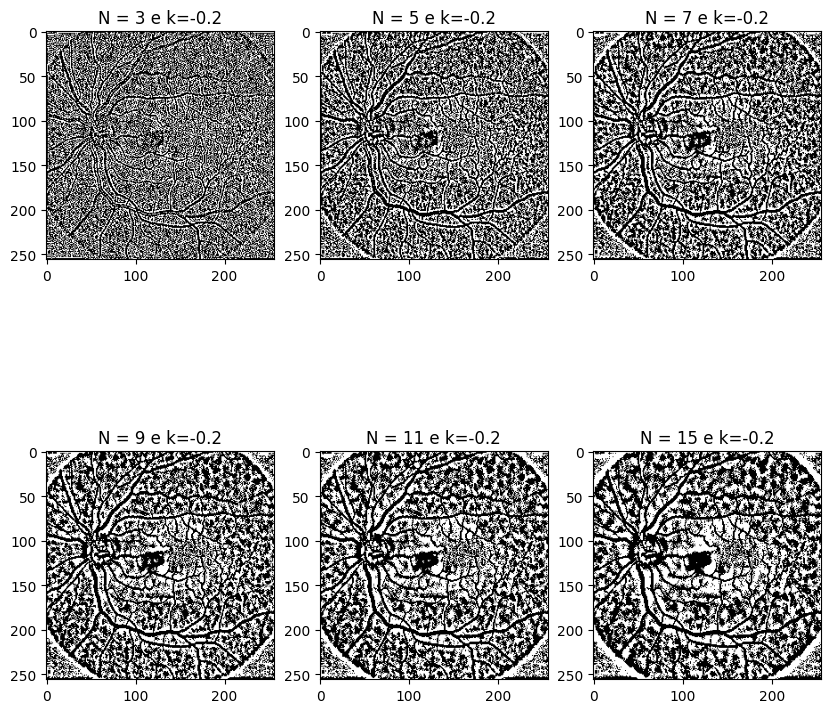

In [ ]:
n=np.array((3,5,7,9,11,15))#vizinhanças
k= -0.2 #fator de supressão de ruído
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_niblack = MyNickelback(retina,n[i],k)
  Th_niblack  = Th_niblack .astype(np.uint8)
  print(Th_niblack .shape, Th_niblack .dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i])+' e k=-0.2')
  plt.imshow(Th_niblack,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


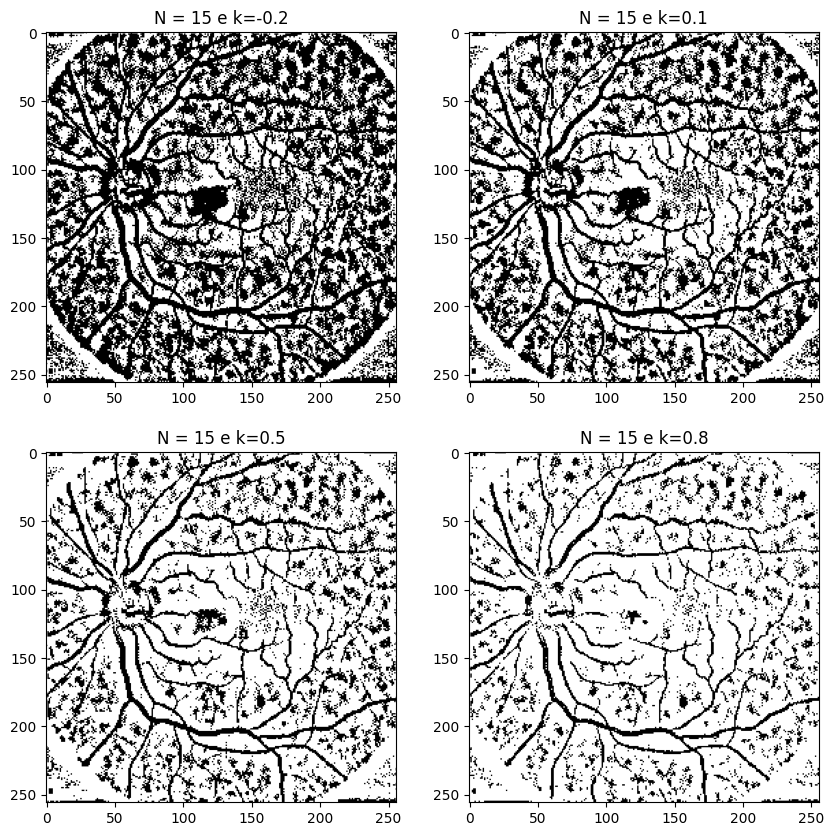

In [ ]:
k=np.array((-0.2,0.1,0.5,0.8))#vizinhanças
n=15 #fator de supressão de ruído
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(k)):
  Th_niblack = MyNickelback(retina,n,k[i])
  Th_niblack  = Th_niblack .astype(np.uint8)
  print(Th_niblack .shape, Th_niblack .dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = 15 e k='+str(k[i]))
  plt.imshow(Th_niblack,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8


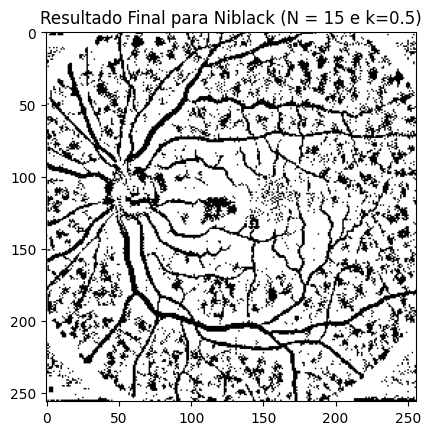

In [ ]:
k=0.5#vizinhanças
n=15 #fator de supressão de ruído
Th_niblack = MyNickelback(retina,n,k)
Th_niblack  = Th_niblack .astype(np.uint8)
print(Th_niblack .shape, Th_niblack .dtype)
plt.title('Resultado Final para Niblack (N = 15 e k=0.5)')
plt.imshow(Th_niblack,cmap='gray')


plt.show()#exibir a figura

# Metodo de Sauvola e Pietaksinen
 Sauvola e Pietaksinen sugerem valores de k = 0.5 e R = 128.

In [ ]:
def My_sauvola_pietaksinen (A,n,k,R):
    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            media = np.mean(K)
            dsvp = np.std(K)
            s = (dsvp/R)-1
            T = media*(1+(k*s))
            #print(T)
            if A[i,j] > T:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


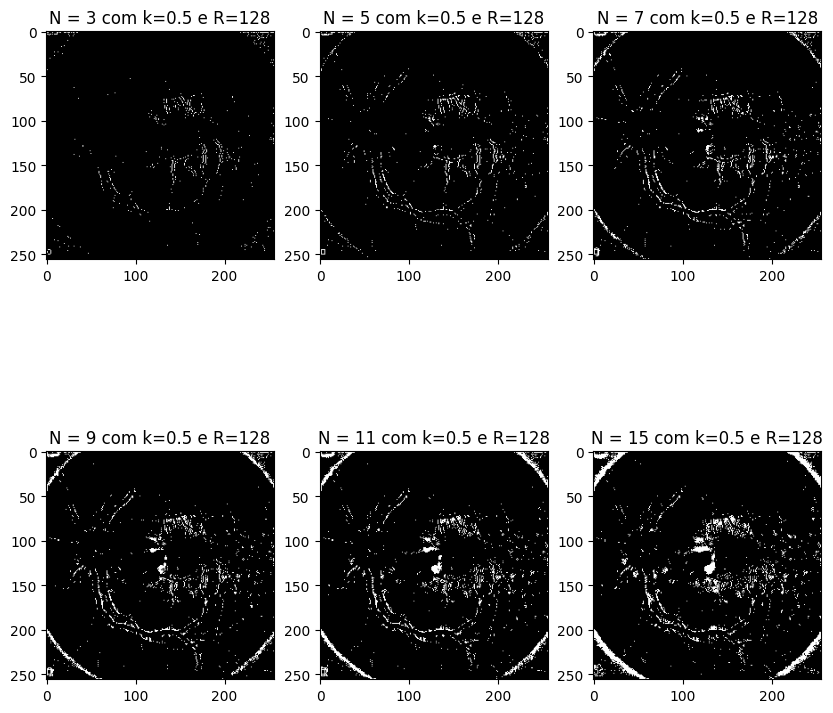

In [ ]:
n=np.array((3,5,7,9,11,15))#vizinhanças
k= 0.5 #fator de supressão de ruído
R = 128
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_sauvola_pietaksinen = My_sauvola_pietaksinen(retina,n[i],k,R)
  Th_sauvola_pietaksinen  = Th_sauvola_pietaksinen.astype(np.uint8)
  print(Th_sauvola_pietaksinen.shape, Th_sauvola_pietaksinen.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i])+' com k=0.5 e R=128')
  plt.imshow(Th_sauvola_pietaksinen,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


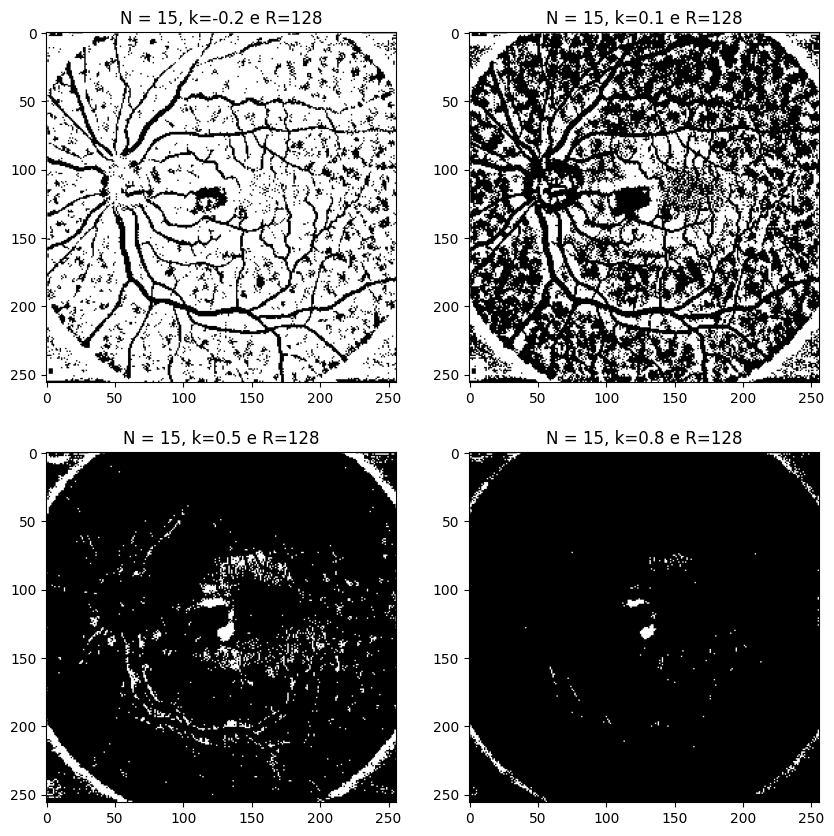

In [ ]:
n=15 #vizinhanças
k=np.array((-0.2,0.1,0.5,0.8))
R = 128
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(k)):
  Th_sauvola_pietaksinen = My_sauvola_pietaksinen(retina,n,k[i],R)
  Th_sauvola_pietaksinen  = Th_sauvola_pietaksinen.astype(np.uint8)
  print(Th_sauvola_pietaksinen.shape, Th_sauvola_pietaksinen.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = 15, k='+str(k[i])+ ' e R=128')
  plt.imshow(Th_sauvola_pietaksinen,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


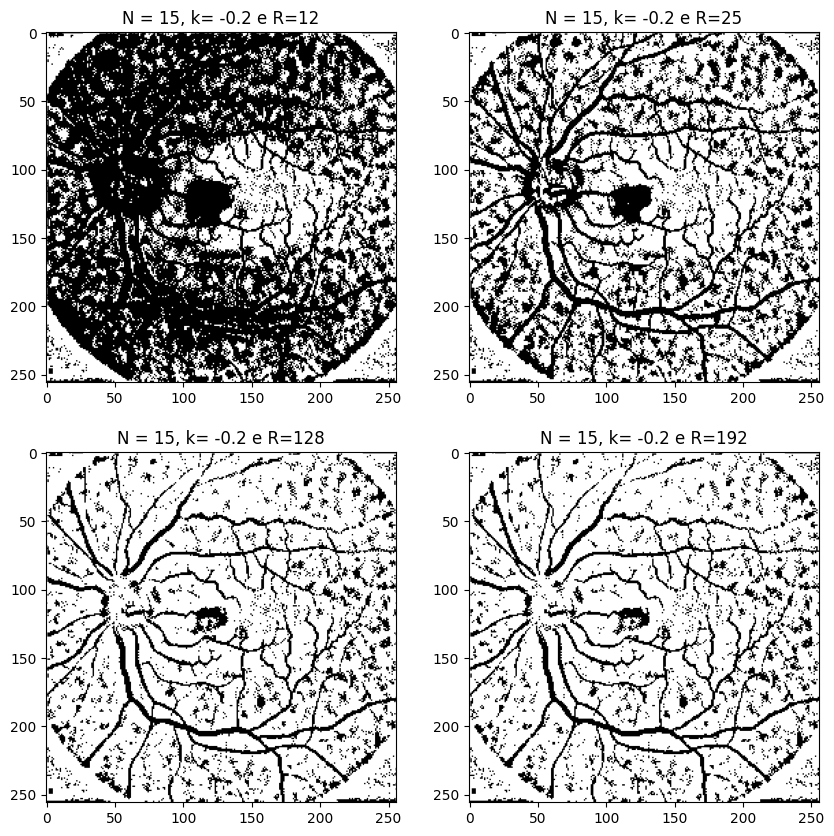

In [ ]:
n=15 #vizinhanças
k=-0.2
R = np.array((12,25,128,192))
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(R)):
  Th_sauvola_pietaksinen = My_sauvola_pietaksinen(retina,n,k,R[i])
  Th_sauvola_pietaksinen  = Th_sauvola_pietaksinen.astype(np.uint8)
  print(Th_sauvola_pietaksinen.shape, Th_sauvola_pietaksinen.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = 15, k= -0.2 e R='+str(R[i]))
  plt.imshow(Th_sauvola_pietaksinen,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8


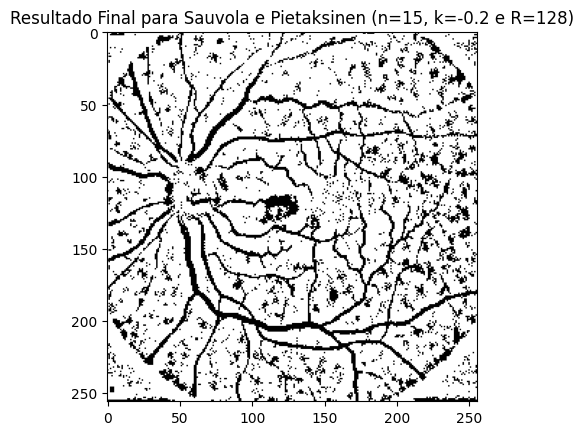

In [ ]:
n=15 #vizinhanças
k=-0.2
R = 128

Th_sauvola_pietaksinen = My_sauvola_pietaksinen(retina,n,k,R)
Th_sauvola_pietaksinen  = Th_sauvola_pietaksinen.astype(np.uint8)
print(Th_sauvola_pietaksinen.shape, Th_sauvola_pietaksinen.dtype)
plt.title('Resultado Final para Sauvola e Pietaksinen (n=15, k=-0.2 e R=128)')
plt.imshow(Th_sauvola_pietaksinen,cmap='gray')


plt.show()#exibir a figura

# Metodo de Phansalskar, More e Sabale

Os autores sugerem k = 0.25, R = 0.5, p = 2 e q = 10. Qualquer outro valor numerico ´
diferente de 0 e v ´ alido para ´ k. O valor de R e diferente do m ´ etodo [5], pois usa uma intensidade ´
normalizada da imagem.


In [ ]:
import math
def MyPhansalskar(A,n,k,R,p,q):
    A = A/255.0

    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            media = np.mean(K)
            dsvp = np.std(K)
            s = (dsvp/R)-1
            e = math.exp(-q*media)
            T = media*(1+p*e+k*s)
            #print(T)
            if A[i,j] > T:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


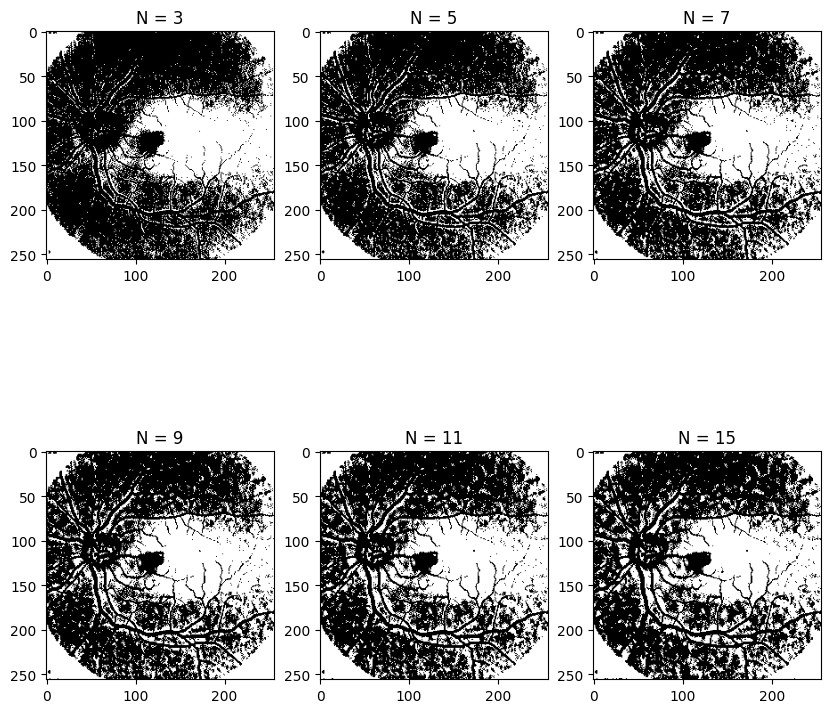

In [ ]:
n=np.array((3,5,7,9,11,15))#vizinhanças
k = 0.25 #fator de supressão de ruído
R = 0.5
p = 2
q = 10
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_Phansalskar = MyPhansalskar(retina,n[i],k,R,p,q)
  Th_Phansalskar = Th_Phansalskar.astype(np.uint8)
  print(Th_Phansalskar.shape, Th_Phansalskar.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i]))
  plt.imshow(Th_Phansalskar,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


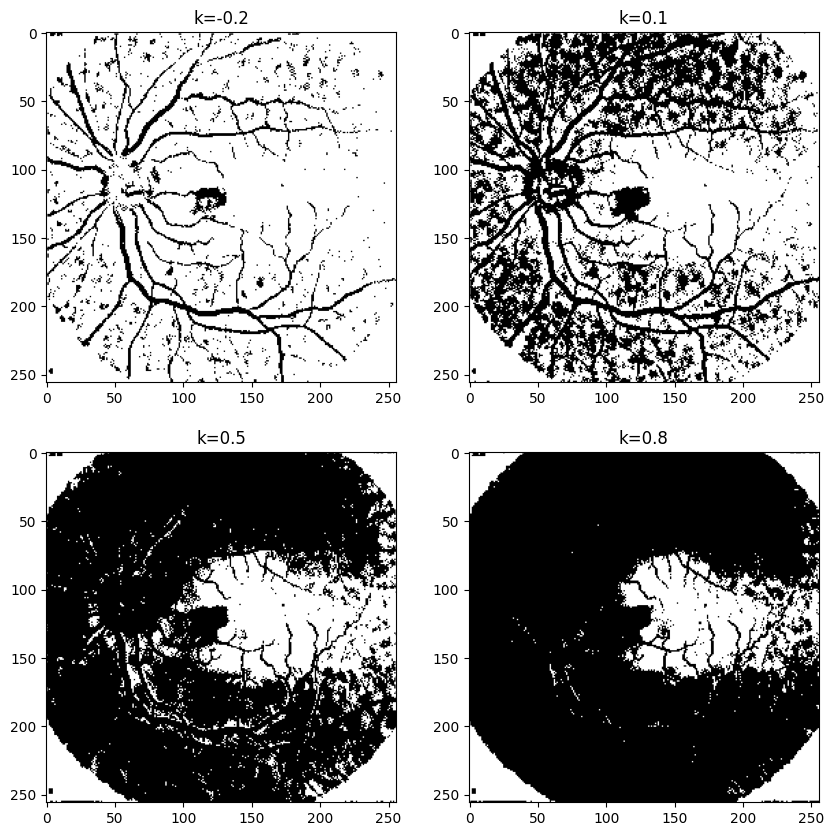

In [ ]:
n=15
k=np.array((-0.2,0.1,0.5,0.8))
R = 0.5
p = 2
q = 10
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(k)):
  Th_Phansalskar = MyPhansalskar(retina,n,k[i],R,p,q)
  Th_Phansalskar = Th_Phansalskar.astype(np.uint8)
  print(Th_Phansalskar.shape, Th_Phansalskar.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('k='+str(k[i]))
  plt.imshow(Th_Phansalskar,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


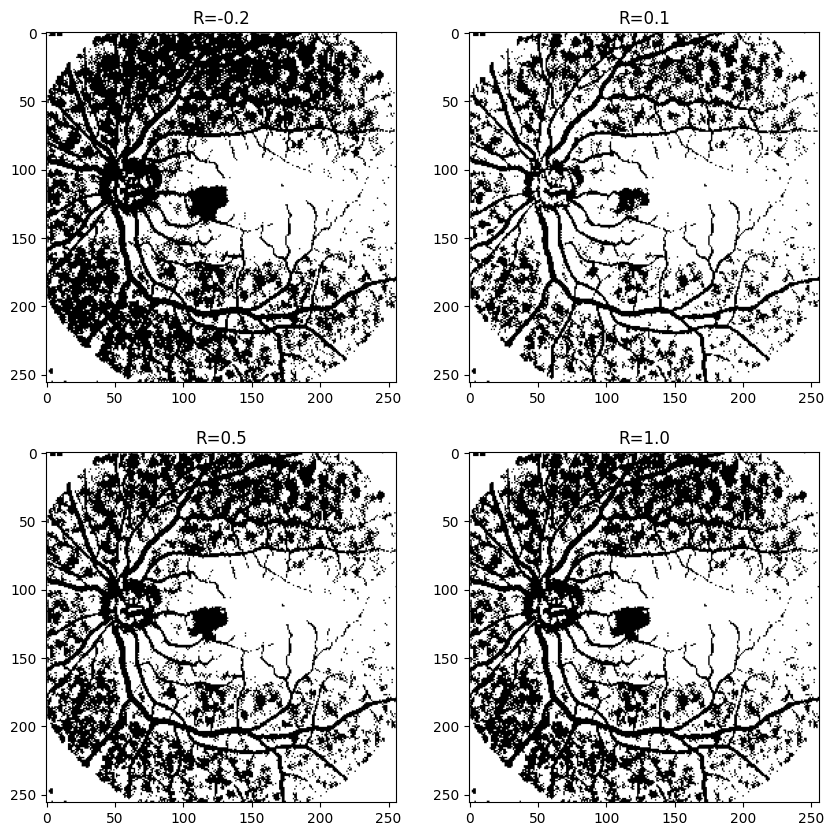

In [ ]:
n=15
k=0.1
R = np.array((-0.2,0.1,0.5,1))
p = 2
q = 10
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(R)):
  Th_Phansalskar = MyPhansalskar(retina,n,k,R[i],p,q)
  Th_Phansalskar = Th_Phansalskar.astype(np.uint8)
  print(Th_Phansalskar.shape, Th_Phansalskar.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('R='+str(R[i]))
  plt.imshow(Th_Phansalskar,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


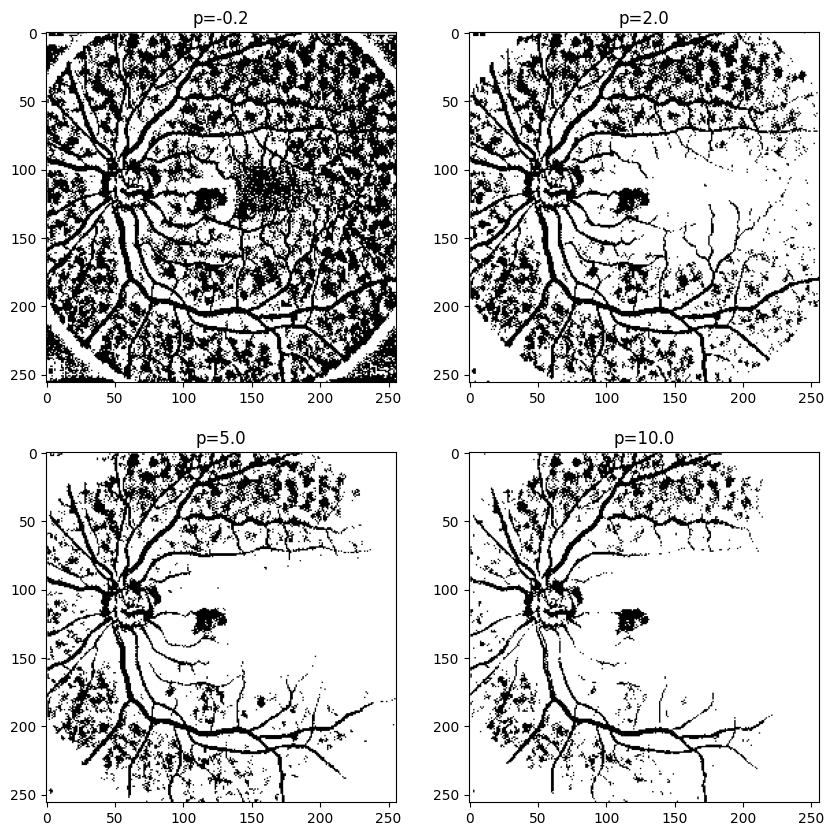

In [ ]:
n=15
k=0.1
R = 0.1
p = np.array((-0.2,2,5,10))
q = 10
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(p)):
  Th_Phansalskar = MyPhansalskar(retina,n,k,R,p[i],q)
  Th_Phansalskar = Th_Phansalskar.astype(np.uint8)
  print(Th_Phansalskar.shape, Th_Phansalskar.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('p='+str(p[i]))
  plt.imshow(Th_Phansalskar,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


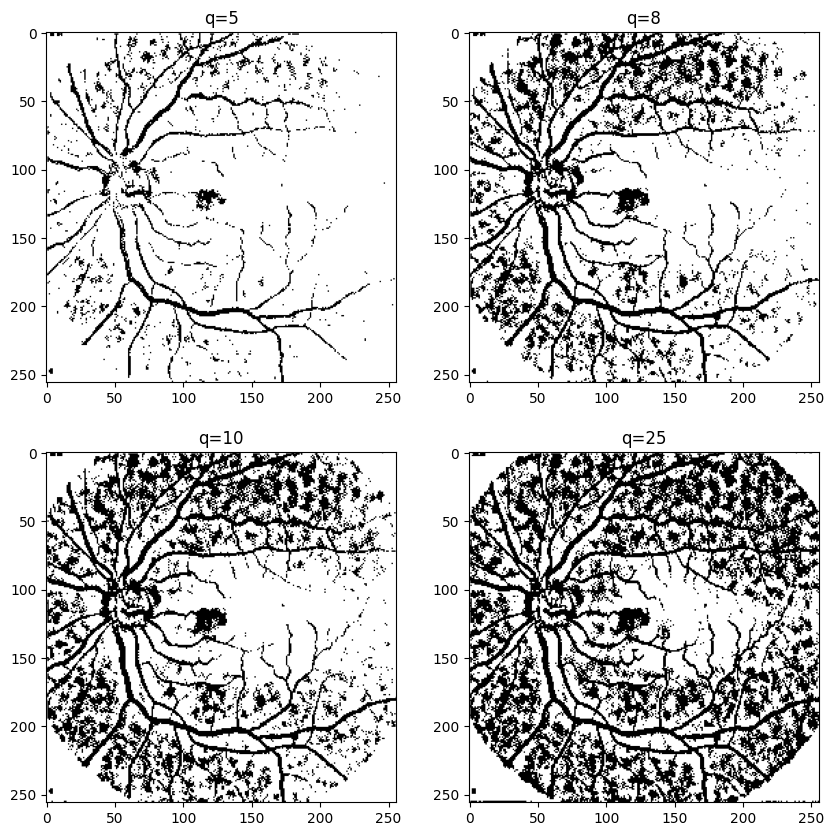

In [ ]:
n=15
k=0.1
R = 0.1
p = 2
q = np.array((5,8,10,25))
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(q)):
  Th_Phansalskar = MyPhansalskar(retina,n,k,R,p,q[i])
  Th_Phansalskar = Th_Phansalskar.astype(np.uint8)
  print(Th_Phansalskar.shape, Th_Phansalskar.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('q='+str(q[i]))
  plt.imshow(Th_Phansalskar,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8


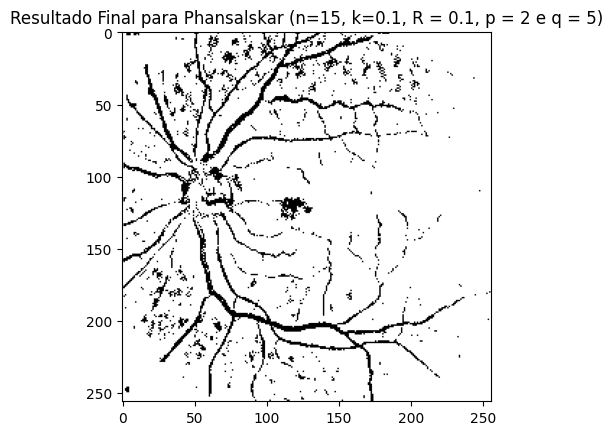

In [ ]:
n=15
k=0.1
R = 0.1
p = 2
q = 5
Th_Phansalskar = MyPhansalskar(retina,n,k,R,p,q)
Th_Phansalskar = Th_Phansalskar.astype(np.uint8)
print(Th_Phansalskar.shape, Th_Phansalskar.dtype)
plt.title('Resultado Final para Phansalskar (n=15, k=0.1, R = 0.1, p = 2 e q = 5)')
plt.imshow(Th_Phansalskar,cmap='gray')


plt.show()#exibir a figura

# Metodo do Contraste

In [ ]:
def MyContrast(A,n):
    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            Dmax = abs( A[i,j] - np.max(K))
            Dmin = abs( A[i,j] - np.min(K))
            #print(T)
            if Dmin < Dmax:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


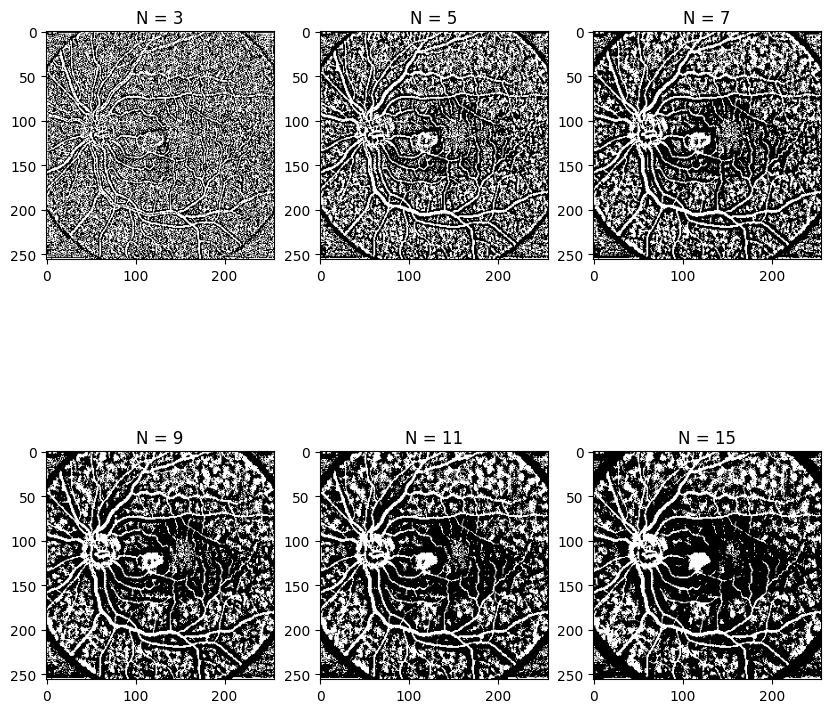

In [ ]:
n=np.array((3,5,7,9,11,15))#vizinhanças
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_contrast = MyContrast(retina,n[i])
  Th_contrast = Th_contrast.astype(np.uint8)
  print(Th_contrast.shape, Th_contrast.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i]))
  plt.imshow(Th_contrast,cmap='gray')


plt.show()#exibir a figura

#Metodo da Média

In [ ]:
def MyMedia(A,n,C):
    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            T = np.mean(K) - C
            #print(T)
            if A[i,j] > T:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


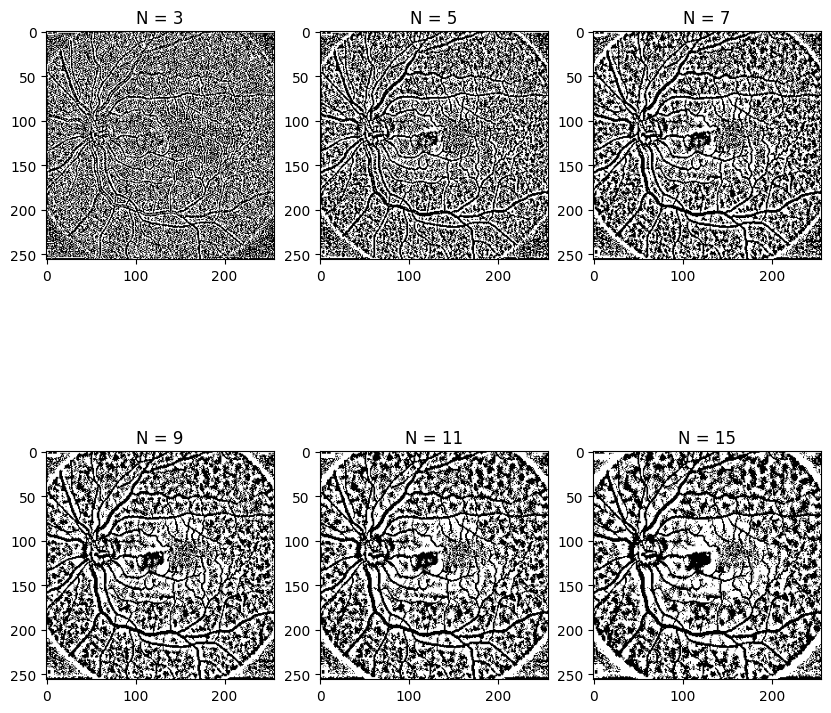

In [ ]:
n = np.array((3,5,7,9,11,15))#vizinhanças
C = 0.5
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_media = MyMedia(retina,n[i],C)
  Th_media = Th_media.astype(np.uint8)
  print(Th_media.shape, Th_media.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i]))
  plt.imshow(Th_media,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


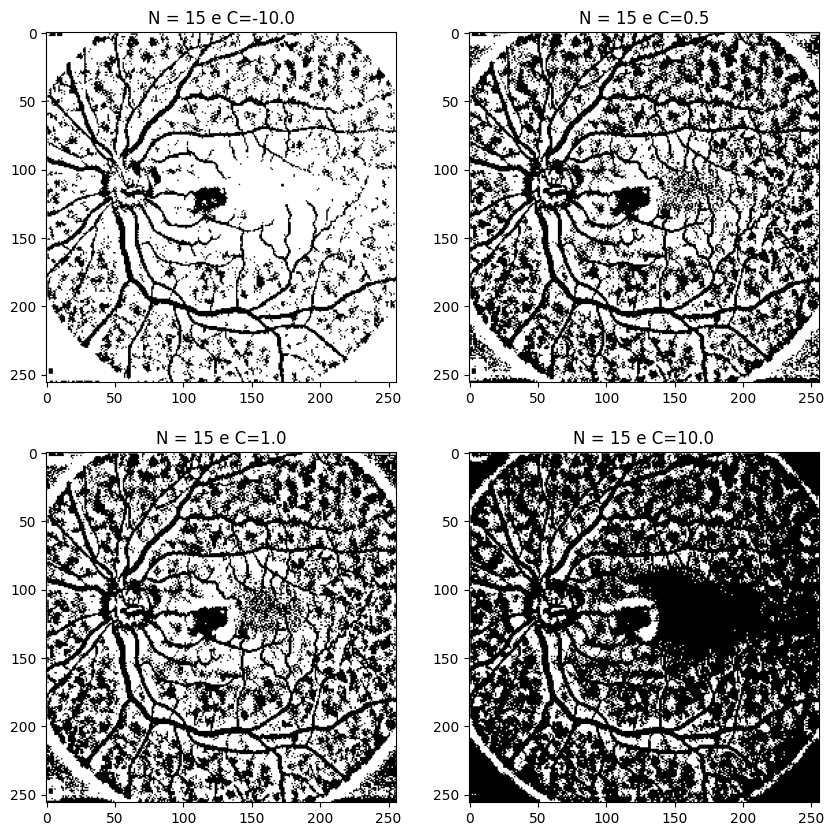

In [ ]:
n = 15
C = np.array((-10,0.5,1,10))
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 2 #linhas
columns = 2 #colunas
for i in range(len(C)):
  Th_media = MyMedia(retina,n,C[i])
  Th_media = Th_media.astype(np.uint8)
  print(Th_media.shape, Th_media.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = 15 e C='+str(C[i]))
  plt.imshow(Th_media,cmap='gray')


plt.show()#exibir a figura

(256, 256) uint8


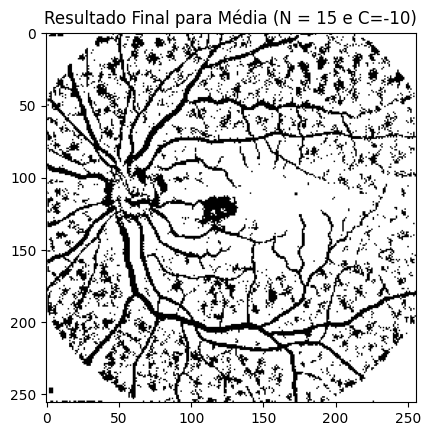

In [ ]:
n = 15
C=-10
Th_media = MyMedia(retina,n,C)
Th_media = Th_media.astype(np.uint8)
print(Th_media.shape, Th_media.dtype)
plt.title('Resultado Final para Média (N = 15 e C=-10)')
plt.imshow(Th_media,cmap='gray')

#Metodo da Mediana

In [ ]:
def MyMedian(A,n):
    K = np.zeros((n,n))

    padding = int(np.trunc(n/2))  #cria um padding de tamanho do filtro/2, com resultado truncado, que irá me dizer quantas linhas e colunas da matriz de entrada precisa copiar para fora

    B = np.pad(A,padding,'symmetric')

    Y = np.zeros(A.shape) #inicializa a matriz de saída com zeros

    for i in range(A.shape[0]):
        for j in range(A.shape[1]): #laço para percorrer a matriz e fazer a convolução com o filtro
            K = B[i:i+n,j:j+n]
            T = np.median(K)
            #print(T)
            if A[i,j] > T:
                Y[i,j] = 0
            else:
                Y[i,j] = 255

    return (Y)

(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8
(256, 256) uint8


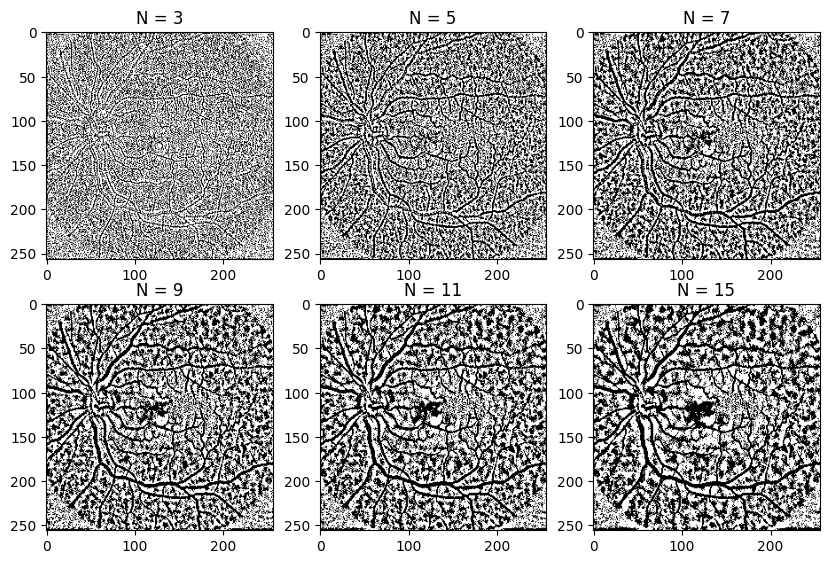

In [ ]:
n = np.array((3,5,7,9,11,15))#vizinhanças
fig = plt.figure(figsize=(10,10))#cria uma figura de tamanho (15,15)
rows = 3 #linhas
columns = 3 #colunas
for i in range(len(n)):
  Th_median = MyMedian(retina,n[i])
  Th_median = Th_median.astype(np.uint8)
  print(Th_median.shape, Th_median.dtype)
  fig.add_subplot(rows, columns, i+1)
  plt.title('N = '+str(n[i]))
  plt.imshow(Th_median,cmap='gray')


plt.show()#exibir a figura